#Reproducibility & initial imports

In [1]:
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torchvision.datasets.utils import *


# Set random seed for reproducibility

# # Set random seeds
# torch.manual_seed(42)
# torch.cuda.manual_seed(42)

manualSeed = 48
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

print("Torch version: ",torch.__version__)

Random Seed:  48
Torch version:  2.3.0+cu121


# Setting up device-agnostic code

In [2]:
# Number of GPUs available. Use 0 for CPU mode.
ngpu = torch.cuda.device_count()

device = torch.device("cuda" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

print(device)
print(ngpu)

cuda
1


# Getting the data

In [3]:
import requests
import zipfile
from pathlib import Path
import os

# dataset url
URL = "https://drive.usercontent.google.com/download?id=1H0NQwLzbD4evp_5qhibXtgBrPIyl1HtG&export=download&authuser=0&confirm=t&uuid=41e6e423-ffdc-4f56-8472-e48d165906a9&at=APZUnTXJCbrfuJbL9GeOLdVyDWq_:1720684182376"
data_path = Path("data/")

image_path = data_path / "celeba"
print("The data path: ", data_path)
print("The image path: ", image_path)

if not image_path.exists():
    image_path.mkdir(parents=True, exist_ok=True)
    print(f"Did not find {image_path} directory, creating one ...")

if not (image_path / "img_align_celeba").exists():
        # downloading the dataset.
    with open(data_path / "img_align_celeba.zip", "wb") as downloaded_file:
        response = requests.get(URL)
        print(response)
        print(response.content)
        response.raise_for_status()
        downloaded_file.write(response.content)

    # unzipping the dataset.
    with zipfile.ZipFile(data_path / "img_align_celeba.zip", "r") as zip_ref:
        print("unzipping the dataset ...")
        zip_ref.extractall(image_path)
        print("Done!")

else:
    print("Images already downloaded and unzipped.")

The data path:  data
The image path:  data/celeba
Did not find data/celeba directory, creating one ...


KeyboardInterrupt: 

In [5]:
from google.colab import drive
import requests
import zipfile
from pathlib import Path
import os

# Mount the Google Drive at /content/drive
drive.mount('/content/drive')

drive_path = Path("/content/drive/My Drive/Datasets/")
data_path = Path("data/")
image_path = data_path / "celeba"

print("The data path: ", data_path)
print("The image path: ", image_path)

if not image_path.exists():
    image_path.mkdir(parents=True, exist_ok=True)
    print(f"Did not find {image_path} directory, creating one ...")

if not (image_path / "img_align_celeba").exists():

    with zipfile.ZipFile(drive_path / "img_align_celeba.zip", "r") as zip_ref:
        print("unzipping the dataset ...")
        zip_ref.extractall(path=image_path) # unzipping from google drive to the image_path in colab's storage...
        print("Done!")


Mounted at /content/drive
The data path:  data
The image path:  data/celeba
unzipping the dataset ...
Done!


In [6]:
def walk_through_dir(dir_path):
  """
  Walks through dir_path returning its contents.
  Args:
    dir_path (str or pathlib.Path): target directory

  Returns:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
  """
  print (f"In ( {dir_path} ):")
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(filenames)} images in '{dirpath}'.")


In [7]:
walk_through_dir(image_path / "img_align_celeba")

In ( data/celeba/img_align_celeba ):
There are 202599 images in 'data/celeba/img_align_celeba'.


In [8]:
# Number of workers for dataloader
# workers = os.cpu_count()
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 4

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Dataset Transformations

Dataset ImageFolder
    Number of datapoints: 202599
    Root location: data/celeba
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=bilinear, max_size=None, antialias=True)
               CenterCrop(size=(64, 64))
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )
first batch's shape: torch.Size([128, 3, 64, 64])


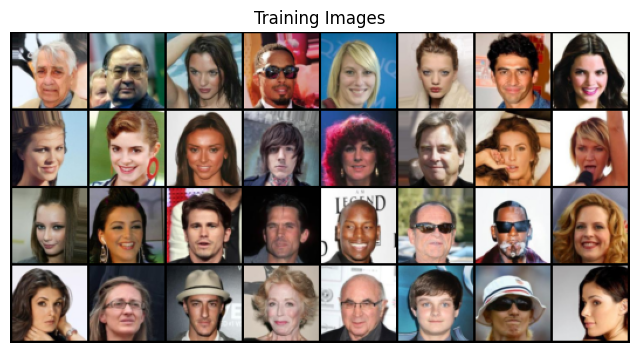

In [9]:
transform = transform=transforms.Compose([
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
            ])

celeba_dataset = dset.ImageFolder(root=image_path, transform=transform)

# dataloader part:
dataloader = torch.utils.data.DataLoader(dataset=celeba_dataset,
                                         batch_size=batch_size, shuffle=True, num_workers=workers)
print(celeba_dataset)
print(dataloader)

batch = next(iter(dataloader))
print("first batch's shape:", batch[0].shape)

plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")

# Transform and plot image
# Note: permute() will change shape of image to suit matplotlib
# (PyTorch default is [C, H, W] but Matplotlib is [H, W, C])
# with Image.open(image_path) as image:    -> for one image
#   transformed_image = transform(image).permute(1, 2, 0)

plt.imshow(np.transpose(vutils.make_grid(batch[0].to(device)[:32], padding=2, normalize=True).cpu(), (1,2,0)))
plt.show()

#Model structure

Ref: https://github.com/soumith/ganhacks

In [10]:
def weights_init(m):

    if isinstance(m, nn.ConvTranspose2d):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.model = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.model(input)


class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


# Function to create the generator / discriminator with multi-GPU handling
def create_generator_discriminator(ngpu, device, generator_discriminator=True):
    net = (Generator(ngpu) if generator_discriminator else Discriminator(ngpu) ).to(device)

    print("Available GPUs: ", torch.cuda.device_count())  # ignore the value of this print when testing.
    print("ngpu value: ", ngpu)

    if (str(device.type) == 'cuda') and (ngpu > 1):
        if ngpu <= torch.cuda.device_count():
            net = nn.DataParallel(net, list(range(ngpu))).to(device)
        else:
            raise ValueError("ngpu is greater than the number of available GPUs")

    net.apply(weights_init)
    return net


## Models' creation unit testing

In [11]:
import unittest
from unittest.mock import patch

# Unit tests
class TestMultiGPUHandling(unittest.TestCase):

    @patch('torch.cuda.device_count', return_value=4)
    def test_single_gpu(self, generator_discriminator=True):
        print("\nrunning the test number 1")
        device_test = torch.device('cuda')
        ngpu_test = 1
        net = create_generator_discriminator(ngpu_test, device_test, generator_discriminator)
        # self.assertIsInstance(net, Generator) if generator_discriminator else self.assertIsInstance(net, Discriminator)
        self.assertIsInstance(net, Generator)

    @patch('torch.cuda.device_count', return_value=4)
    def test_multiple_gpus(self, generator_discriminator=True):
        print("\nrunning the test number 2")
        device_test = torch.device('cuda')
        ngpu_test = 3
        net = create_generator_discriminator(ngpu_test, device_test, generator_discriminator)
        self.assertIsInstance(net, nn.DataParallel)

    @patch('torch.cuda.device_count', return_value=2)
    def test_invalid_ngpu(self, generator_discriminator=True):
        print("\nrunning the test number 3")
        device_test = torch.device('cuda')
        ngpu_test = 3
        with self.assertRaises(ValueError):
            print('Ok, the ValueError raised!')
            create_generator_discriminator(ngpu_test, device_test, generator_discriminator)

if __name__ == '__main__':
    unittest.main(argv=[''], exit=False)

.E


running the test number 3
Ok, the ValueError raised!
Available GPUs:  2
ngpu value:  3

running the test number 2
Available GPUs:  4
ngpu value:  3

running the test number 1


.
ERROR: test_multiple_gpus (__main__.TestMultiGPUHandling)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "/usr/lib/python3.10/unittest/mock.py", line 1379, in patched
    return func(*newargs, **newkeywargs)
  File "<ipython-input-11-7253859adb1b>", line 21, in test_multiple_gpus
    net = create_generator_discriminator(ngpu_test, device_test, generator_discriminator)
  File "<ipython-input-10-d43c38cdb831>", line 79, in create_generator_discriminator
    net = nn.DataParallel(net, list(range(ngpu))).to(device)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/data_parallel.py", line 159, in __init__
    _check_balance(self.device_ids)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/parallel/data_parallel.py", line 26, in _check_balance
    dev_props = _get_devices_properties(device_ids)
  File "/usr/local/lib/python3.10/dist-packages/torch/_utils.py", line 745, in _get_devices_properties
    r

Available GPUs:  4
ngpu value:  1


In [12]:
netG = create_generator_discriminator(ngpu, device, True)
netD = create_generator_discriminator(ngpu, device, False)

print("\nThe Generator's architecture: ",netG)

print("\nThe Discriminator's architecture: ", netD)

Available GPUs:  1
ngpu value:  1
Available GPUs:  1
ngpu value:  1

The Generator's architecture:  Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTran

# Generator & Discriminator training:

In [13]:
# Initialize the ``BCELoss`` function
loss = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator (For keeping track of the generator’s learning progression, we will generate a fixed batch of latent vectors that are drawn from a Gaussian distribution (i.e. fixed_noise))
# In the training loop, periodically this will be inputed fixed_noise into  G, and over the iterations we will see images form out of the noise.
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

print("fixed_noise's shape: ", fixed_noise.shape)

fixed_noise's shape:  torch.Size([64, 100, 1, 1])


In [14]:
data = next(iter(dataloader))
print(type(data))
print(data[0].shape)
print(data[0].size(0))
print(len(dataloader))

<class 'list'>
torch.Size([128, 3, 64, 64])
128
1583


In [15]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch

        netD.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        batch_size = real_images.size(0)

        label = torch.ones((batch_size, ), dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_images).view(-1)

        # Calculate loss on all-real batch
        errD_real = loss(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()


        ## Train with all-fake batch

        # Generate batch of latent vectors
        noise = torch.randn(batch_size, nz, 1, 1, device=device)

        # Generate fake image batch with G
        fake_images = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake_images.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = loss(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()


        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake

        # Update D
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################

        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake_images).view(-1)
        # Calculate G's loss based on this output
        errG = loss(output, label)

        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()

        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[0/4][0/1583]	Loss_D: 1.4231	Loss_G: 3.3043	D(x): 0.5534	D(G(z)): 0.5537 / 0.0405
[0/4][50/1583]	Loss_D: 0.0827	Loss_G: 10.0127	D(x): 0.9439	D(G(z)): 0.0022 / 0.0001
[0/4][100/1583]	Loss_D: 0.3668	Loss_G: 3.7771	D(x): 0.8527	D(G(z)): 0.1394 / 0.0320
[0/4][150/1583]	Loss_D: 0.2077	Loss_G: 3.6738	D(x): 0.9749	D(G(z)): 0.1559 / 0.0337
[0/4][200/1583]	Loss_D: 0.4718	Loss_G: 2.8512	D(x): 0.7631	D(G(z)): 0.1425 / 0.0763
[0/4][250/1583]	Loss_D: 0.4268	Loss_G: 2.5961	D(x): 0.8071	D(G(z)): 0.1605 / 0.1068
[0/4][300/1583]	Loss_D: 0.7505	Loss_G: 1.3063	D(x): 0.5536	D(G(z)): 0.0350 / 0.3420
[0/4][350/1583]	Loss_D: 0.5144	Loss_G: 3.3029	D(x): 0.7085	D(G(z)): 0.0474 / 0.0627
[0/4][400/1583]	Loss_D: 0.6269	Loss_G: 2.8324	D(x): 0.6686	D(G(z)): 0.1215 / 0.0801
[0/4][450/1583]	Loss_D: 0.5699	Loss_G: 3.8046	D(x): 0.7432	D(G(z)): 0.1590 / 0.0290
[0/4][500/1583]	Loss_D: 0.5475	Loss_G: 3.2011	D(x): 0.7328	D(G(z)): 0.1411 / 0.0633
[0/4][550/1583]	Loss_D: 0.3796	Loss_G: 4.4651	D(x): 0.8811	D(G(z)): 0.1790 / 0

# Visualization

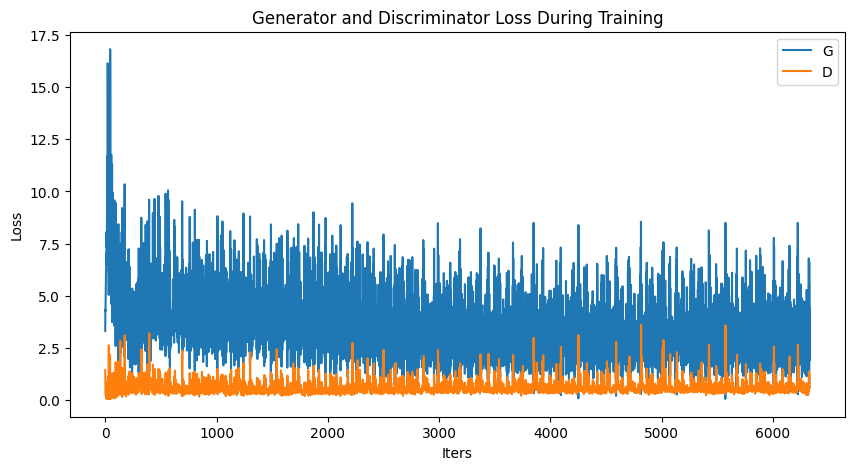

In [16]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iters")
plt.ylabel("Loss")
plt.legend()
plt.show()

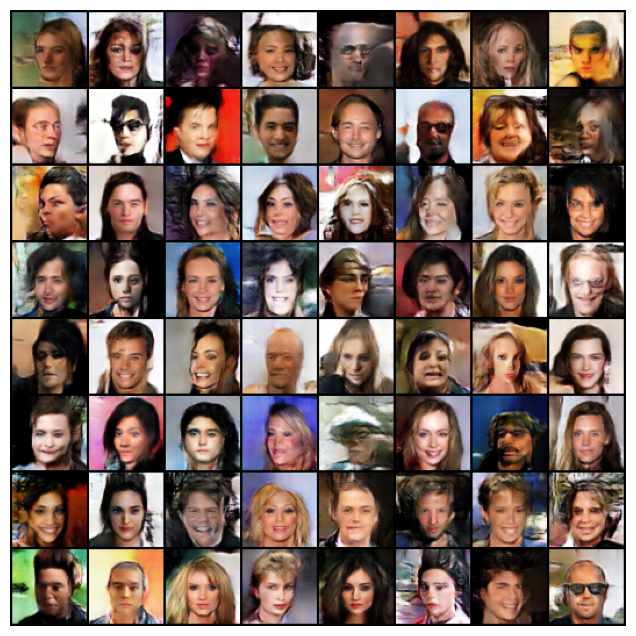

In [17]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# Saving the model

In [18]:
import pickle
def save_model(model: torch.nn.Module,
               target_dir: Path,
               model_name: str):

  # Create target directory
  target_dir.mkdir(parents=True, exist_ok=True)

  # Create model save path
  assert model_name.endswith(".pth") or model_name.endswith(".pt"), "model_name should end with '.pt' or '.pth'"
  model_save_path = target_dir / model_name

  # Save the model state_dict()
  print(f"[INFO] Saving model to: {model_save_path}")
  torch.save(obj=model.state_dict(), f=model_save_path)


def write_list_to_file(filename, num_list):
  with open(filename, 'wb') as file:
    pickle.dump(num_list, file)

In [19]:
models_info_path = Path("models")
save_model(netG, models_info_path, "Generator.pth")
write_list_to_file(models_info_path / "G_losses.pkl", G_losses)
write_list_to_file(models_info_path / "D_losses.pkl", D_losses)

[INFO] Saving model to: models/Generator.pth
